%%%%%%%%%%%%%%%%%%% SONG RESCOMMENDATION SYSTEM %%%%%%%%%%%%%%%%%%%%

In [1]:
#!pip install wordcloud

In [2]:
import numpy as np
import pandas as pd
import os
import json
from zipfile import ZipFile
import re
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt
import difflib

In [3]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


In [4]:
df = pd.read_csv("spotify_millsongdata.csv.zip")

In [5]:
df

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...
...,...,...,...,...
57645,Ziggy Marley,Good Old Days,/z/ziggy+marley/good+old+days_10198588.html,Irie days come on play \r\nLet the angels fly...
57646,Ziggy Marley,Hand To Mouth,/z/ziggy+marley/hand+to+mouth_20531167.html,Power to the workers \r\nMore power \r\nPowe...
57647,Zwan,Come With Me,/z/zwan/come+with+me_20148981.html,all you need \r\nis something i'll believe \...
57648,Zwan,Desire,/z/zwan/desire_20148986.html,northern star \r\nam i frightened \r\nwhere ...


In [6]:
df = df.drop("link",axis=1).reset_index(drop = True)

In [7]:
df

,artist,song,text
0,ABBA,Ahe's My Kind Of Girl,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante","Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,Making somebody happy is a question of give an...
...,...,...,...
57645,Ziggy Marley,Good Old Days,Irie days come on play \r\nLet the angels fly...
57646,Ziggy Marley,Hand To Mouth,Power to the workers \r\nMore power \r\nPowe...
57647,Zwan,Come With Me,all you need \r\nis something i'll believe \...
57648,Zwan,Desire,northern star \r\nam i frightened \r\nwhere ...


In [8]:
import warnings
warnings.filterwarnings("ignore")

In [9]:
df = df.sample(10000)

In [10]:
combined_text = " ".join(df['text'].dropna())
print(combined_text)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [11]:
combined_text

'Many a tear has to fall but it\'s all in the game  \r\nAll in the wonderful game that we know as love  \r\nYou have words with him and your future\'s looking dim  \r\nBut these things your hearts can rise above  \r\n  \r\nOnce in a while he won\'t call but it\'s all in the game  \r\nSoon he\'ll be there at your side with a sweet bouquet  \r\nAnd he\'ll kiss your lips and caress your waiting fingertips  \r\nAnd your heart will fly away  \r\n  \r\n(Soon he\'ll be there at your side) with a sweet bouquet  \r\nThen he\'ll kiss your lips and caress your waiting fingertips  \r\nAnd your heart will fly away\r\n\r\n "Never look back," we said  \r\nHow was I to know I\'d miss you so?  \r\nLoneliness up ahead, emptiness behind  \r\nWhere do I go?  \r\n  \r\nAnd you didn\'t hear  \r\nAll my joy through my tears  \r\nAll my hopes through my fears  \r\nDid you now, still I miss you somehow  \r\n  \r\nFrom the bottom of my broken heart  \r\nThere\'s just a thing or two I\'d like you to know  \r\nYo

In [12]:
word_cloud = WordCloud(width = 800,height = 400,background_color = "white").generate(combined_text)
print(word_cloud)

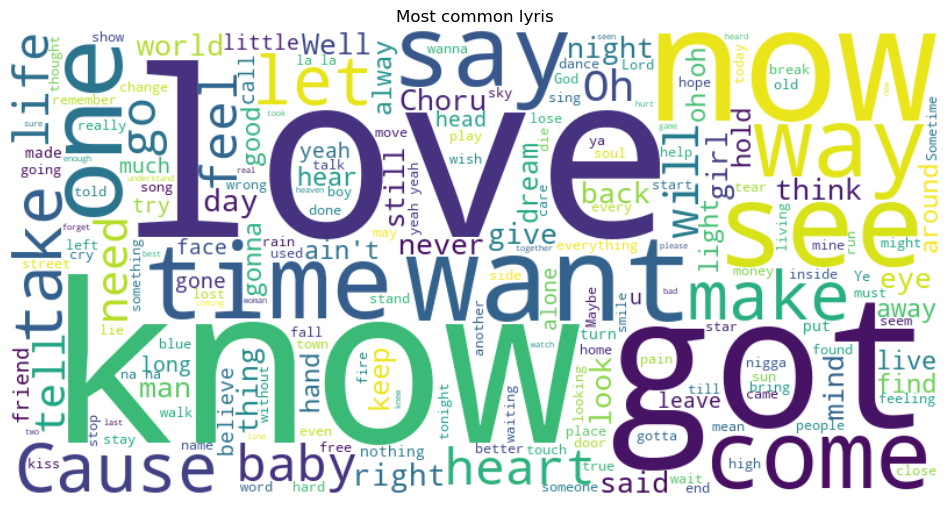

In [13]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud,interpolation = 'bilinear')
plt.axis('off')
plt.title("Most common lyris")
plt.show()

In [14]:
#nltk.download('punkt')
#nltk.download('punkt_tab')
#nltk.download('stopwords')

In [15]:
# getting the stop_words 
stop_words = set(stopwords.words("english"))


In [16]:
def preprocess_text(text):
    #removing special characters and numbers
    text = re.sub(r"[^a-zA-Z\s]"," ",text)
    # converting text to lower case
    text = text.lower()
    # tokenizing each text
    tokens = word_tokenize(text)
    #removing the stopwords from tokens
    tokens = [word for word in tokens if word not in stop_words]
    return " ".join(tokens)

In [17]:
df['cleaned_text'] = df['text'].apply(preprocess_text)

In [18]:
df

,artist,song,text,cleaned_text
28104,Cliff Richard,It's All In The Game,Many a tear has to fall but it's all in the ga...,many tear fall game wonderful game know love w...
26452,Britney Spears,From The Bottom Of My Broken Heart,"""Never look back,"" we said \r\nHow was I to k...",never look back said know miss loneliness ahea...
50266,Ray Boltz,The Last To Be Chosen,"The Last To Be Chosen \r\nWords by Ray Boltz,...",last chosen words ray boltz music steve millik...
5650,Everlast,Anyone,"[Verse 1] \r\nI got my pick up truck, and I g...",verse got pick truck got gun got taste whiskey...
55879,Weezer,The Good Life,When I look in the mirror I can't believe what...,look mirror believe see tell funky dude starin...
...,...,...,...,...
18811,Steve Miller Band,Blue Eyes,"I'm half a sinner, and I'm half a saint \r\nI...",half sinner half saint hard tell company keep ...
26467,Britney Spears,I Will Be There,Oh yeah \r\nYou don't have to say what's on y...,oh yeah say mind cause know give leave behind ...
12471,Marillion,Sympathy,Now when you climb into your bed tonight \r\n...,climb bed tonight lock bolt door think cold da...
15210,Out Of Eden,Spirit Moves,"I, I can feel the Spirit when it moves down in...",feel spirit moves soul comes make whole said f...


In [19]:
# converting the text data into feature vector
vectorizer = TfidfVectorizer()
feature_vector = vectorizer.fit_transform(df['cleaned_text'])
similarity = cosine_similarity(feature_vector,feature_vector)
print(similarity)

[[1.         0.05102124 0.03145193 ... 0.01033784 0.04785924 0.03492278]
 [0.05102124 1.         0.11664129 ... 0.06413708 0.08804362 0.16464115]
 [0.03145193 0.11664129 1.         ... 0.         0.03590186 0.01950858]
 ...
 [0.01033784 0.06413708 0.         ... 1.         0.11004216 0.03017598]
 [0.04785924 0.08804362 0.03590186 ... 0.11004216 1.         0.09587767]
 [0.03492278 0.16464115 0.01950858 ... 0.03017598 0.09587767 1.        ]]


In [20]:
# Based on the similarity score ythe model recommend the song for the user

In [23]:
def recommend_song(song_name, similarity = similarity, df = df , top_n = 10):
    idx = df[df["song"].str.lower() == song_name.lower()].index

    if len(idx) == 0:
        print("song not found in dataset")
    idx = idx[0]
    similarity_score = list(enumerate(similarity[idx]))
    sorted_similarity_score = sorted(similarity_score , key = lambda x : x[1],reverse  = True)
    
    sorted_similarity_score = sorted_similarity_score[ :top_n]
    ind = [song[0] for song in sorted_similarity_score]
    title_from_index = df.iloc[ind][['artist','song']]
    print(f" - {title_from_index}")
   
    

In [24]:
# Recoomending the top 10 song based the similarity score
song = input("%%%%%% ^^^^^^ Enter your favourate movie:  ")
recommend_song(song)


%%%%%% ^^^^^^ Enter your favourate movie:   Anyone


 -                    artist                          song
18918       Stevie Wonder  If Your Love Cannot Be Moved
7029       Gloria Estefan                           Say
19695       Tracy Chapman            Tell It Like It Is
3751          David Bowie           And I Say To Myself
17101       Rascal Flatts                      Some Say
31717             Erasure         Don't Say You Love Me
730             Amy Grant                 Say Once More
26141            Bon Jovi              I Love This Town
14868  Olivia Newton-John                Don't Say That
43378           Meat Loaf               Did I Say That?
